# Solar Dynamo

In [1]:
using DifferentialEquations
using StochasticDelayDiffEq
using SpecialFunctions
using Plots
using XLSX
using Turing
using Distributions
using SimulatedAnnealingABC
using DataFrames
using Random
using Distances
using FFTW

In [2]:
# EXTRACTING OPEN MAGNETIC FLUX AND SUNSPOT NUMBER RECORDS FROM XLSX FILE

df = DataFrame(
    year = Int[],
    open_magn_flux = Float64[],
    open_magn_flux_err = Float64[],
    ssa_open_magn_flux = Float64[],
    sunspots_num = Float64[],
    sunspots_err = Float64[],
    ssa_sunspots = Float64[]
)

# Apri il file e leggi i dati
XLSX.openxlsx("SN Usoskin Brehm.xlsx") do file
    sheet = file["Data"] 

    for row in XLSX.eachrow(sheet)
        if isa(row[2], Number)
            push!(df, (
                year = row[2],
                open_magn_flux = row[3],
                open_magn_flux_err = row[4],
                ssa_open_magn_flux = row[5],
                sunspots_num = row[7],
                sunspots_err = row[8],
                ssa_sunspots = row[9]
            ))
        end
    end
end


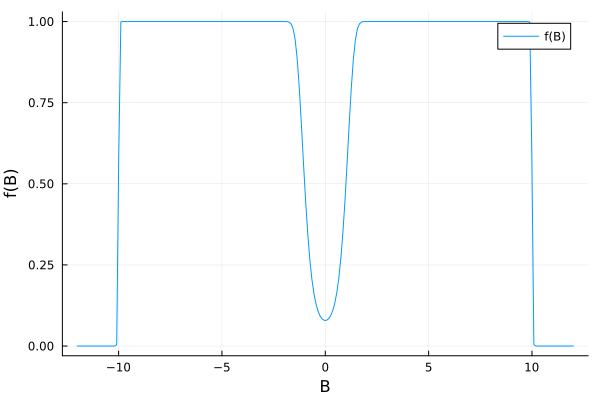

In [3]:
# BOX-SHAPED FUNCTION FOR THE MAGNETIC FIELD RANGE 

# Define limits
B_min = 1
B_max = 10

# Define the function
function f(B)
    return 1 / 4 * (1 .+ erf.(B .^ 2 .- B_min ^ 2)) .* (1 .- erf.(B .^ 2 .- B_max ^ 2))
end

# Plot (range [-12, 12])
B_values = range(-12, stop = 12, length = 240)
f_values = f(B_values)
plot(B_values, f_values, xlabel = "B", ylabel = "f(B)", label = "f(B)")

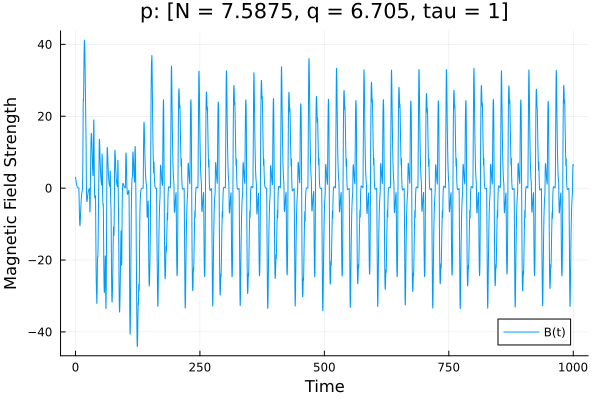

In [4]:
# DDE PROBLEM WITHOUT NOISE AND PERIODIC MODULATION

# Define parameters
N = 8.4
T0 = 0.52
T1 = 0.3
tau = 1
q = (T0 + T1) / tau
N = 7.5875
q = 6.7050
p = [N, q, tau]

# Define initial conditions
B0 = [3, 0]
tspan = (0, 1000)
h(p, t) = [0.0, 0.0]

# Define the function for the DDE
function MagneticField1(du, u, h, p, t)
  N, q, tau = p

  B = u[1]
  dB = u[2]

  du[1] = dB
  du[2] = - ((2 / tau) * dB + (B / tau^2) + N * h(p, t - q)[1] * f(h(p, t - q)[1]))
end

# Define and solve the DDE problem
prob = DDEProblem(MagneticField1, B0, h, tspan, p)
sol = solve(prob, MethodOfSteps(Tsit5()), saveat = 0.01)

# Plot 
plot(sol.t, sol[1, :], label = "B(t)", xlabel = "Time", ylabel = "Magnetic Field Strength", title = "p: [N = $N, q = $q, tau = $tau]", linewidth = 1)
#plot!(sol.t, sol[2, :], label="dB/dt", linewidth=1)
#plot!(sol.t, sol[3, :], label="d^2B/dt^2", linewidth=1)

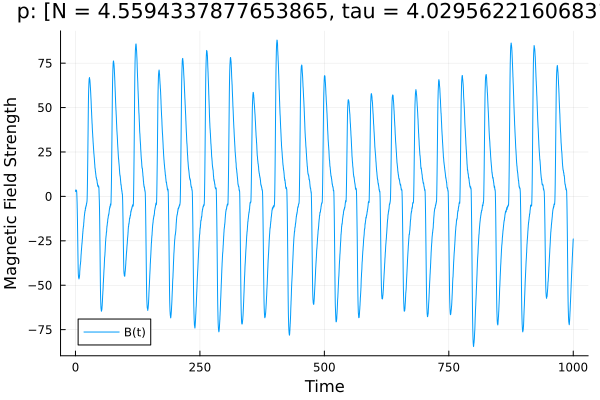

In [5]:
# SDDE PROBLEM WITHOUT PERIODIC MODULATION

# Define parameters
N = 4.5594337877653865
T0 = 0.52
T1 = 0.3
tau = 4.029562216068315
q = (T0 + T1) / tau
sigma = 0.10354986294770369
T = 9.176796014373267
B_max = 6.036375264367653
params = [N, T, tau, sigma, B_max]

# Define initial conditions
B0 = [3, 0]
tspan = (0, 1000)
h(p, t) = [0.0, 0.0]

# Define noise initial conditions
noise0 = [1.0]

# Define the function for the DDE
function MagneticField(du, u, h, p, t)
  N, T, tau, sigma, Bmax = p

  B = u[1]
  dB = u[2]

  du[1] = dB
  du[2] = - ((2 / tau) * dB + (B / tau^2) + N * h(p, t - (T / tau))[1] * f(h(p, t - (T / tau))[1]))
end

function noise(du, u, h, p, t)
  N, T, tau, sigma, Bmax = p
  du[1] = (sigma * Bmax)
end

# Define and solve the SDDE problem
prob = SDDEProblem(MagneticField, noise, B0, h, tspan, params)
sol = solve(prob, EM(), dt = 0.01)

# Plot 
plot(sol.t, sol[1, :], label = "B(t)", xlabel = "Time", ylabel = "Magnetic Field Strength", title = "p: [N = $N, tau = $tau]", linewidth = 1)
#plot!(sol.t, sol[2, :], label="dB/dt", linewidth=1)
#plot!(sol.t, sol[3, :], label="d^2B/dt^2", linewidth=1)

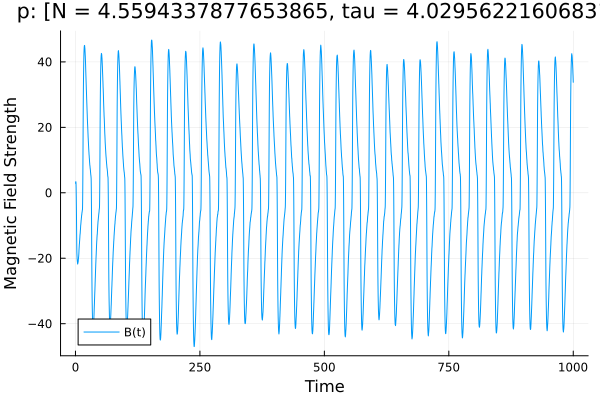

In [6]:
# SDDE PROBLEM WITHOUT PERIODIC MODULATION

# Define parameters
N = 4.5594337877653865
T0 = 0.52
T1 = 0.3
tau = 4.029562216068315
q = (T0 + T1) / tau
sigma = 0.10354986294770369
T = 9.176796014373267
B_max = 6.036375264367653

params = [6.2, 3.1, 3.5, 0.04, 6.0]
# Define initial conditions
B0 = [3, 0]
tspan = (0, 1000)
h(p, t) = [0.0, 0.0]

# Define noise initial conditions
noise0 = [1.0]

# Define the function for the DDE
function MagneticField(du, u, h, p, t)
  N, T, tau, sigma, Bmax = p

  B = u[1]
  dB = u[2]

  du[1] = dB
  du[2] = - ((2 / tau) * dB + (B / tau^2) + N * h(p, t - (T / tau))[1] * f(h(p, t - (T / tau))[1]))
end

function noise(du, u, h, p, t)
  N, T, tau, sigma, Bmax = p
  du[1] = (sigma * Bmax)
end

# Define and solve the SDDE problem
prob = SDDEProblem(MagneticField, noise, B0, h, tspan, params)
sol = solve(prob, EM(), dt = 0.01)

# Plot 
plot(sol.t, sol[1, :], label = "B(t)", xlabel = "Time", ylabel = "Magnetic Field Strength", title = "p: [N = $N, tau = $tau]", linewidth = 1)
#plot!(sol.t, sol[2, :], label="dB/dt", linewidth=1)
#plot!(sol.t, sol[3, :], label="d^2B/dt^2", linewidth=1)

In [7]:
# ANALYSIS WITH SYNTETIC DATA
p = [6.2, 3.1, 3.5, 0.04, 6.0]  # Parameters N, T, tau, sigma, Bmax
tspan = (0.0, 10.0)
u0 = [1.0, 0.0]  # Initial condition: [B, dB]

# Create a DDEProblem object
prob = SDDEProblem(MagneticField, noise, B0, h, tspan, p)
# Solve the DDE using a suitable method
sol = solve(prob, EM(), dt = 0.01)
# Generate observational data
observed_data = sol[1, :]  # Add noise
fourier_transform_obs = fft(observed_data)
fourier_range_obs = 1:6:120
fourier_obs = abs.(fourier_transform_obs[fourier_range_obs])

# Define prior distributions for the parameters
prior = product_distribution(Uniform(1, 15), Uniform(0.1, 15.0), Uniform(0.1, 6.0), Uniform(0.01, 0.3), Uniform(1, 15))

# Define a function to simulate data and calculate distance
function f_dist(x::Vector{Float64}; type::Int64 = 1)
    sol = solve(SDDEProblem(MagneticField, noise, B0, h, tspan, x), EM(), dt = 0.01)
    simulated_data = sol[1, :]

    # Perform Fourier transform
    fourier_transform = fft(simulated_data)
    fourier_range = 1:6:120
    fourier_stats = abs.(fourier_transform[fourier_range])

    rho = [euclidean(fourier_stats[i], fourier_obs[i]) for i in 1:length(fourier_stats)]
    
    return rho
end

# Run the ABC with Simulated Annealing
result = sabc(f_dist, prior, n_particles=1000, n_simulation=1000000, v=1.0, type=1)
println("Estimated parameters: ", result)

┌ Info: Using threads: 1 
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:192
┌ Info: Initializing population...
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:219
┌ Info: Initial resampling (δ = 0.1) - ESS = 552.2223630914409 
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:258
┌ Info: Population with 1000 particles initialised.
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:280
┌ Info: Initial ϵ = [0.5788232851813226, 0.3542392558711724, 0.3333836894331524, 0.3299524817367105, 0.330477998796111, 0.3321242205299158, 0.33289778794852604, 0.3253897962052881, 0.3359412722524595, 0.3301327622567892, 0.3272652565516175, 0.33205706336830876, 0.3230736173423262, 0.3347451114217745, 0.32571908693560714, 0.32511090330343806, 0.33720

Estimated parameters: Approximate posterior sample with 1000 particles:
  - simulations used: 1000000
  - average transformed distance: 0.02416
  - ϵ: [6.633e-10, 1.163e-9, 1.822e-9, 7.521e-8, 1.929e-9, 1.291e-7, 1.903e-9, 9.629e-6, 2.239e-8, 8.746e-9, 1.546e-9, 5.843e-9, 1.229e-9, 4.497e-7, 2.443e-7, 1.58e-7, 5.4e-10, 8.042e-10, 4.532e-6, 7.527e-8]
  - population resampling: 4
  - acceptance rate: 0.008272
The sample can be accessed with the field `population`.
The history of ϵ can be accessed with the field `state.ϵ_history`.
 -------------------------------------- 



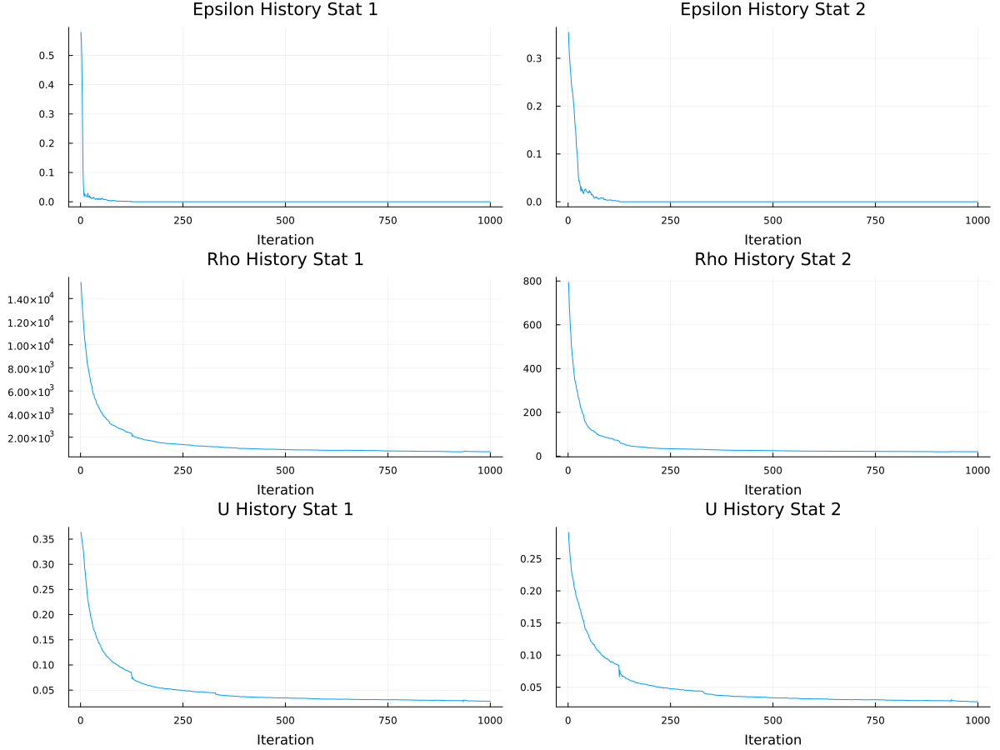

In [8]:
## Extract posterior population, trajectories for epsilon, rho and u
pop_singeps = hcat(result.population...)
eps_singeps = hcat(result.state.ϵ_history...)
rho_singeps = hcat(result.state.ρ_history...)
u_singeps = hcat(result.state.u_history...)

rho_stat1 = rho_singeps[1, :]
rho_stat2 = rho_singeps[2, :]

eps_stat1 = eps_singeps[1, :]
eps_stat2 = eps_singeps[2, :]

u_stat1 = u_singeps[1, :]
u_stat2 = u_singeps[2, :]

p1 = plot(eps_stat1, title="Epsilon History Stat 1", xlabel="Iteration", legend=false)
p2 = plot(eps_stat2, title="Epsilon History Stat 2", xlabel="Iteration", legend=false)
p3 = plot(rho_stat1, title="Rho History Stat 1", xlabel="Iteration", legend=false)
p4 = plot(rho_stat2, title="Rho History Stat 2", xlabel="Iteration", legend=false)
p5 = plot(u_stat1, title="U History Stat 1", xlabel="Iteration", legend=false)
p6 = plot(u_stat2, title="U History Stat 2", xlabel="Iteration", legend=false)

# Combine plots
combined_plot = plot(p1, p2, p3, p4, p5, p6, layout=(3, 2), size=(1200, 900))

display(combined_plot)

In [9]:
# Extract parameter samples for each parameter
pop_history = vec(pop_singeps)
param_samples = reshape(pop_history, 5, 1000)

println("Valore di N:")
N_value = param_samples[1,:]
N = mean(N_value)
println(N)


println("\nValore di T:")
T_value = param_samples[2,:]
T = mean(T_value)
println(T)

println("\nValore di tau:")
tau_value = param_samples[3,:]
tau = mean(tau_value)
println(tau)

println("\nValore di sigma:")
sigma_value = param_samples[4,:]
sigma = mean(sigma_value)
println(sigma)

println("\nValore di Bmax:")
Bmax_value = param_samples[5,:]
Bmax = mean(Bmax_value)
println(Bmax)

Valore di N:
6.250164785513205

Valore di T:
3.557903316666391

Valore di tau:
3.2273640705021966

Valore di sigma:
0.06031971176059011

Valore di Bmax:
4.5558529659206854


In [10]:
# ANALYSIS WITH REAL DATA
observed_data = df.sunspots_num
fourier_transform_obs = fft(observed_data)
fourier_range_obs = 1:6:120
fourier_obs = abs.(fourier_transform_obs[fourier_range_obs])

# Define prior distributions for the parameters
prior = product_distribution(Uniform(1, 15), Uniform(0.1, 15.0), Uniform(0.1, 6.0), Uniform(0.01, 0.3), Uniform(1, 15))

# Define a function to simulate data and calculate distance
function f_dist(x::Vector{Float64}; type::Int64 = 1)
    sol = solve(SDDEProblem(MagneticField, noise, B0, h, tspan, x), EM(), dt = 0.01)
    simulated_data = sol[1, :]

    # Perform Fourier transform
    fourier_transform = fft(simulated_data)
    fourier_range = 1:6:120
    fourier_stats = abs.(fourier_transform[fourier_range])

    rho = [euclidean(fourier_stats[i], fourier_obs[i]) for i in 1:length(fourier_stats)]
    
    return rho
end

# Run the ABC with Simulated Annealing
result = sabc(f_dist, prior, n_particles=50, n_simulation=200000, v=1.0, type=1)
println("Estimated parameters: ", result)

┌ Info: Using threads: 1 
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:192
┌ Info: Initializing population...
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:219
┌ Info: Initial resampling (δ = 0.1) - ESS = 24.53562889730737 
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:258
┌ Info: Population with 50 particles initialised.
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:280
┌ Info: Initial ϵ = [0.4165418565278759, 0.27381422354598844, 0.29069675263197214, 0.2509413281446432, 0.251518598723838, 0.2515185987238381, 0.27381422354598844, 0.24921696228458914, 0.2669864155234916, 0.29611724639035986, 0.2657638541323496, 0.2801795398557016, 0.30375598383212443, 0.30375598383212443, 0.2615290814650637, 0.2954335762630928, 0.2591

Estimated parameters: Approximate posterior sample with 50 particles:
  - simulations used: 200000
  - average transformed distance: 0.02821
  - ϵ: [4.622e-12, 2.135e-15, 8.837e-9, 3.325e-9, 1.088e-8, 2.828e-8, 8.624e-9, 1.49e-8, 1.745e-8, 1.24e-8, 9.253e-9, 1.025e-8, 6.361e-9, 4.626e-9, 5.973e-9, 6.15e-9, 5.155e-9, 1.124e-8, 7.529e-9, 1.237e-8]
  - population resampling: 148
  - acceptance rate: 0.07436
The sample can be accessed with the field `population`.
The history of ϵ can be accessed with the field `state.ϵ_history`.
 -------------------------------------- 



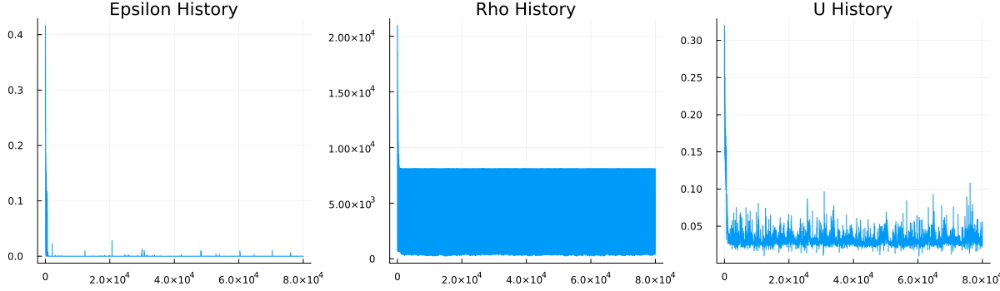

In [11]:
## Extract posterior population, trajectories for epsilon, rho and u
pop_singeps = hcat(result.population...)
eps_singeps = hcat(result.state.ϵ_history...)
rho_singeps = hcat(result.state.ρ_history...)
u_singeps = hcat(result.state.u_history...)

eps_history = vec(eps_singeps) 
rho_history = vec(rho_singeps) 
u_history = vec(u_singeps) 

p1 = plot(eps_history, title="Epsilon History", xlabel="Iteration", legend=false)
p2 = plot(rho_history, title="Rho History", xlabel="Iteration", legend=false)
p3 = plot(u_history, title="U History", xlabel="Iteration", legend=false)

combined_plot = plot(p1, p2, p3, layout = (1, 3), size = (1200, 350))

display(combined_plot)

In [12]:
# Extract parameter samples for each parameter
pop_history = vec(pop_singeps)
param_samples = reshape(pop_history, 5, 50)

println("Valore di N:")
N_value = param_samples[1,:]
N = mean(N_value)
println(N)


println("\nValore di T:")
T_value = param_samples[2,:]
T = mean(T_value)
println(T)

println("\nValore di tau:")
tau_value = param_samples[3,:]
tau = mean(tau_value)
println(tau)

println("\nValore di sigma:")
sigma_value = param_samples[4,:]
sigma = mean(sigma_value)
println(sigma)

println("\nValore di Bmax:")
Bmax_value = param_samples[5,:]
Bmax = mean(Bmax_value)
println(Bmax)

Valore di N:
8.377582622804844

Valore di T:
12.878554593652582

Valore di tau:
3.1196863733105453

Valore di sigma:
0.16715704493038785

Valore di Bmax:
8.966586004133317


In [13]:
# ANALYSIS WITH SYNTETIC DATA
p = [6.2, 3.1, 3.5, 0.04, 6.0]  # Parameters N, T, tau, sigma, Bmax
tspan = (0.0, 10.0)
u0 = [1.0, 0.0]  # Initial condition: [B, dB]

# Create a DDEProblem object
prob = SDDEProblem(MagneticField, noise, B0, h, tspan, p)
# Solve the DDE using a suitable method
sol = solve(prob, EM(), dt = 0.01)
# Generate observational data
observed_data = sol[1, :]  # Add noise
s1obs = mean(observed_data); s2obs = std(observed_data) 
ss_obs = [s1obs, s2obs]

# Define prior distributions for the parameters
prior = product_distribution(Uniform(1, 15), Uniform(0.1, 15.0), Uniform(0.1, 6.0), Uniform(0.01, 0.3), Uniform(1, 15))

# Define a function to simulate data and calculate distance
function f_dist(x::Vector{Float64}; type::Int64 = 1)
    sol = solve(SDDEProblem(MagneticField, noise, B0, h, tspan, x), EM(), dt = 0.01)
    simulated_data = sol[1, :]

    # Mean and Std
    s1sim = mean(simulated_data); s2sim = std(simulated_data) 
    ss_sim = [s1sim, s2sim]

    rho = [euclidean(ss_sim[i], ss_obs[i]) for i in 1:size(ss_sim,1)]
    
    return rho
end

# Run the ABC with Simulated Annealing
result = sabc(f_dist, prior, n_particles=1000, n_simulation=500000, v=1.0, type=1)
println("Estimated parameters: ", result)

┌ Info: Using threads: 1 
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:192
┌ Info: Initializing population...
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:219
┌ Info: Initial resampling (δ = 0.1) - ESS = 989.3605187712361 
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:258
┌ Info: Population with 1000 particles initialised.
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:280
┌ Info: Initial ϵ = [0.7594654987779096, 0.78786073674786]
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC.jl:281
┌ Info: 2024-05-20T16:27:12.231 -- Starting population updates.
└ @ SimulatedAnnealingABC C:\Users\lucre\.julia\packages\SimulatedAnnealingABC\LT2t8\src\SimulatedAnnealingABC

In [ ]:
## Extract posterior population, trajectories for epsilon, rho and u
pop_singeps = hcat(result.population...)
eps_singeps = hcat(result.state.ϵ_history...)
rho_singeps = hcat(result.state.ρ_history...)
u_singeps = hcat(result.state.u_history...)

eps_history = vec(eps_singeps) 
rho_history = vec(rho_singeps) 
u_history = vec(u_singeps) 


p2 = plot(rho_history, title="Rho History", xlabel="Iteration",  legend=false, yscale=:log10)


display(p2)
savefig(p2, "rho_history_log.png")